In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
import missingno as msno
import os
import altair as alt

import warnings
warnings.filterwarnings("ignore")

In [117]:
import geopandas as gpd
import folium
from folium import plugins
from folium import Marker, Circle, CircleMarker, Choropleth  
from folium.plugins import MarkerCluster, HeatMap
from geopandas.tools import geocode
from shapely.geometry import Point 
plt.style.use('seaborn')

### Load the datasets

In [118]:
def load_data(filepath):
    os.chdir(filepath)
    files = os.listdir()
    data = {}
    for file in files:
        filename = file.lower().split('.')[0]
        filename_df = pd.read_csv(file)
        data[filename] =  filename_df.convert_dtypes()
    return(data)

filepath = '/mnt/d/Amit/data-science/MADS/SIADS591/data/'
data_dict = load_data(filepath)    

### Required utilities

#### Gep processing utilities

In [119]:
# global city geo dictionary
city_geo_dict = {}

def city_geocoder(city):
    ''' geocodes the city, which we want to explore
    city - name of the city you wish to explore'''
    try:
        if city in city_geo_dict:
            if city_geo_dict[city]:
                result = city_geo_dict[city]
            else:
                return(None)
        else:
            result = geocode(city, provider='nominatim').geometry.iloc[0]
            if city == 'from other city':
                print('going to write in dict')            
            city_geo_dict[city] = result
        return(result)
    except:
            city_geo_dict[city] = None
            print('could not geocode the city:', city)
    return None
    
def geocity_processing(data):
    df = data.copy()
    df['geometry'] = df.apply(lambda row: city_geocoder(row.city), axis=1)
    df['geometry'] = df.apply(lambda row: row.geometry if row.geometry else city_geocoder(row.province), axis=1)
    df['latitude'] = df['geometry'].apply(lambda point: point.y if point else None)
    df['longitude'] = df['geometry'].apply(lambda point: point.x if point else None)
    return(df)
    
def geocitylatlong_processing(data):
    df = data.copy()
    df['geometry'] = df.apply(lambda row: Point(float(row.longitude),float(row.latitude))   \
                                if row.latitude else city_geocoder(row.city), axis=1)
    df['geometry'] = df.apply(lambda row: row.geometry if row.geometry else city_geocoder(row.province), axis=1)
    df['latitude'] = df['geometry'].apply(lambda point: point.y if point else None)
    df['longitude'] = df['geometry'].apply(lambda point: point.x if point else None)
    return(df)
    

#### Folium geo map utilities

In [120]:
def visualize_data_mcgroup(city, data):
    '''visualize hospital data in MarkerCluster
    city - name of the city
    hospitals - dataframe for hospital data'''
    point = city_geocoder(city)
    if not point:
        print('Please check the city/county name, Thank You.')
        return
    
    m_1 = folium.Map(location=[point.y, point.x], zoom_start=8)
    mc = MarkerCluster()
    for idx, row in data.iterrows():
        mc.add_child(Marker(location=[row['latitude'], row['longitude']], tooltip=row['city'], popup=row['province']))

    m_1.add_child(mc)
    return(m_1)

def geo_heatmap(point, data):
    m = folium.Map(location=point, zoom_start=7)
    folium.plugins.HeatMap(data).add_to(m)
    return(m)

def geo_clusterheatmap(point, heat_data, cluster_data):
    m = folium.Map(location=point, zoom_start=7)
    folium.plugins.HeatMap(heat_data).add_to(m)
    mc = MarkerCluster()
    for idx, row in cluster_data.iterrows():
        mc.add_child(Marker(location=[row['latitude'], row['longitude']], tooltip=row['city'], popup=row['province']))

    m.add_child(mc)
    return(m)

## Exploratory Data Analysis

### Check for missing values

In [121]:
def pct_missing(data):
    df = data.copy()
    for col in df.columns:
        pct_missing = np.mean(df[col].isnull())
        print('{} - {:.2f}%'.format(col, pct_missing*100))

# pct_missing(patientinfo)   
for key in data_dict.keys():
    print('\nMissing data by percentage in dataset:', key, '\n')
    pct_missing(data_dict[key])


Missing data by percentage in dataset: case 

 case_id - 0.00%
province - 0.00%
city - 0.00%
group - 0.00%
infection_case - 0.00%
confirmed - 0.00%
latitude - 0.00%
longitude - 0.00%

Missing data by percentage in dataset: patientinfo 

patient_id - 0.00%
sex - 21.72%
age - 26.72%
country - 0.00%
province - 0.00%
city - 1.82%
infection_case - 17.79%
infected_by - 73.94%
contact_number - 84.69%
symptom_onset_date - 86.64%
confirmed_date - 0.06%
released_date - 69.27%
deceased_date - 98.72%
state - 0.00%

Missing data by percentage in dataset: patientroute 

patient_id - 0.00%
global_num - 0.00%
date - 0.00%
province - 0.00%
city - 0.00%
latitude - 0.00%
longitude - 0.00%

Missing data by percentage in dataset: policy 

policy_id - 0.00%
country - 0.00%
type - 0.00%
gov_policy - 0.00%
detail - 3.28%
start_date - 0.00%
end_date - 60.66%
Unnamed: 7 - 0.00%
Unnamed: 8 - 100.00%

Missing data by percentage in dataset: region 

code - 0.00%
province - 0.00%
city - 0.00%
latitude - 0.00%
long

### Exploring case dataset

In [122]:
case = data_dict['case'].copy()
case['city'] = case['city'].apply(lambda city: city if city != '-' else None)
case['city'] = case['city'].apply(lambda city: city if city != 'from other city' else 'NotaCity')
case['latitude'] = case['latitude'].apply(lambda x: x if x != '-' else None)
case['longitude'] = case['longitude'].apply(lambda x: x if x != '-' else None)
case_gdf =  geocitylatlong_processing(case)
case_gdf.head(10)              

could not geocode the city: NotaCity
could not geocode the city: None


,case_id,province,city,group,infection_case,confirmed,latitude,longitude,geometry
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,139,37.538621,126.992652,POINT (126.992652 37.538621)
1,1000002,Seoul,Gwanak-gu,True,Richway,119,37.482080,126.901384,POINT (126.901384 37.48208)
2,1000003,Seoul,Guro-gu,True,Guro-gu Call Center,95,37.508163,126.884387,POINT (126.884387 37.508163)
3,1000004,Seoul,Yangcheon-gu,True,Yangcheon Table Tennis Club,43,37.546061,126.874209,POINT (126.874209 37.546061)
4,1000005,Seoul,Dobong-gu,True,Day Care Center,43,37.679422,127.044374,POINT (127.044374 37.679422)
5,1000006,Seoul,Guro-gu,True,Manmin Central Church,41,37.481059,126.894343,POINT (126.894343 37.481059)
6,1000007,Seoul,NotaCity,True,SMR Newly Planted Churches Group,36,37.566679,126.978291,POINT (126.9782914 37.5666791)
7,1000008,Seoul,Dongdaemun-gu,True,Dongan Church,17,37.592888,127.056766,POINT (127.056766 37.592888)
8,1000009,Seoul,NotaCity,True,Coupang Logistics Center,25,37.566679,126.978291,POINT (126.9782914 37.5666791)
9,1000010,Seoul,Gwanak-gu,True,Wangsung Church,30,37.481735,126.930121,POINT (126.930121 37.481735)


In [123]:
heat_case = case_gdf.groupby(['latitude', 'longitude'])['confirmed'].sum().reset_index().values.tolist()
point = [36, 128]
case_heatmap = geo_heatmap(point, heat_case)
case_heatmap

In [124]:
case = data_dict['case'].copy()
case_province_order = case_gdf.groupby('province')['confirmed'].sum().sort_values(ascending=True).index.to_list()

In [125]:
base = alt.Chart(case)
encoding = base.encode(
            x=alt.X(
                'sum(confirmed):Q',
                title='confirmed count'),
            y = alt.Y('province:N',                      
                      title = 'province',
                      sort=case_province_order
                    ),
            color = alt.Color('province:N',
                        scale=alt.Scale(scheme='spectral', reverse=True),
                        sort=case_province_order)
)

bar = encoding.mark_bar()
bar.properties(title='Province wise distribution of covid cases')

alt.Chart(...)

#### Observation 1: Top five covid-19 hit provinces in the South Korea:
- Daegu,
- Gyeongsangbuk-do,
- Seoul,
- Gyeonggi-do,
- Incheon

### Exploring patientinfo data

In [126]:
patientinfo = data_dict['patientinfo'].copy()
patientinfo.head()

,patient_id,sex,age,country,province,city,infection_case,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,male,50s,Korea,Seoul,Gangseo-gu,overseas inflow,<NA>,75,1/22/2020,1/23/2020,2/5/2020,<NA>,released
1,1000000002,male,30s,Korea,Seoul,Jungnang-gu,overseas inflow,<NA>,31,<NA>,1/30/2020,3/2/2020,<NA>,released
2,1000000003,male,50s,Korea,Seoul,Jongno-gu,contact with patient,2002000001,17,<NA>,1/30/2020,2/19/2020,<NA>,released
3,1000000004,male,20s,Korea,Seoul,Mapo-gu,overseas inflow,<NA>,9,1/26/2020,1/30/2020,2/15/2020,<NA>,released
4,1000000005,female,20s,Korea,Seoul,Seongbuk-gu,contact with patient,1000000002,2,<NA>,1/31/2020,2/24/2020,<NA>,released


In [127]:
patientinfo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5165 entries, 0 to 5164
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   patient_id          5165 non-null   Int64 
 1   sex                 4043 non-null   string
 2   age                 3785 non-null   string
 3   country             5165 non-null   string
 4   province            5165 non-null   string
 5   city                5071 non-null   string
 6   infection_case      4246 non-null   string
 7   infected_by         1346 non-null   string
 8   contact_number      791 non-null    string
 9   symptom_onset_date  690 non-null    string
 10  confirmed_date      5162 non-null   string
 11  released_date       1587 non-null   string
 12  deceased_date       66 non-null     string
 13  state               5165 non-null   string
dtypes: Int64(1), string(13)
memory usage: 570.1 KB


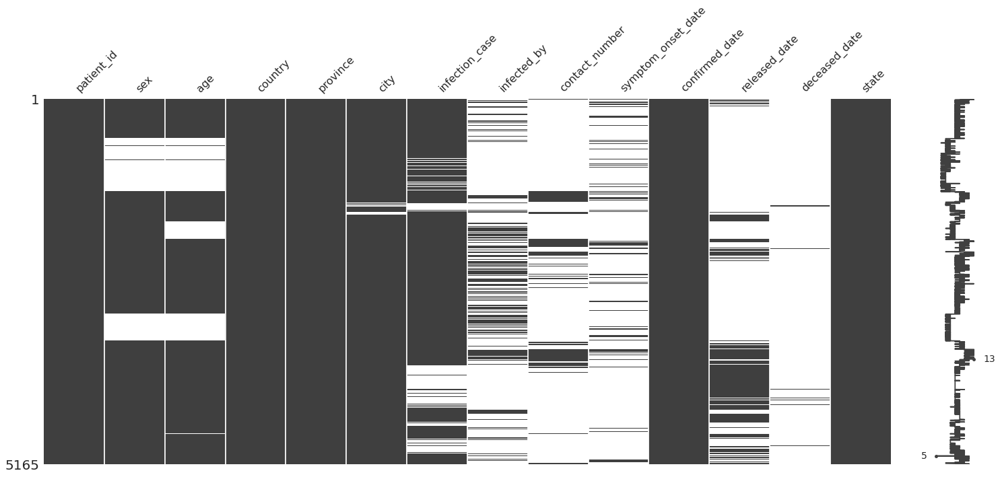

In [128]:
msno.matrix(data_dict['patientinfo'])
plt.show()

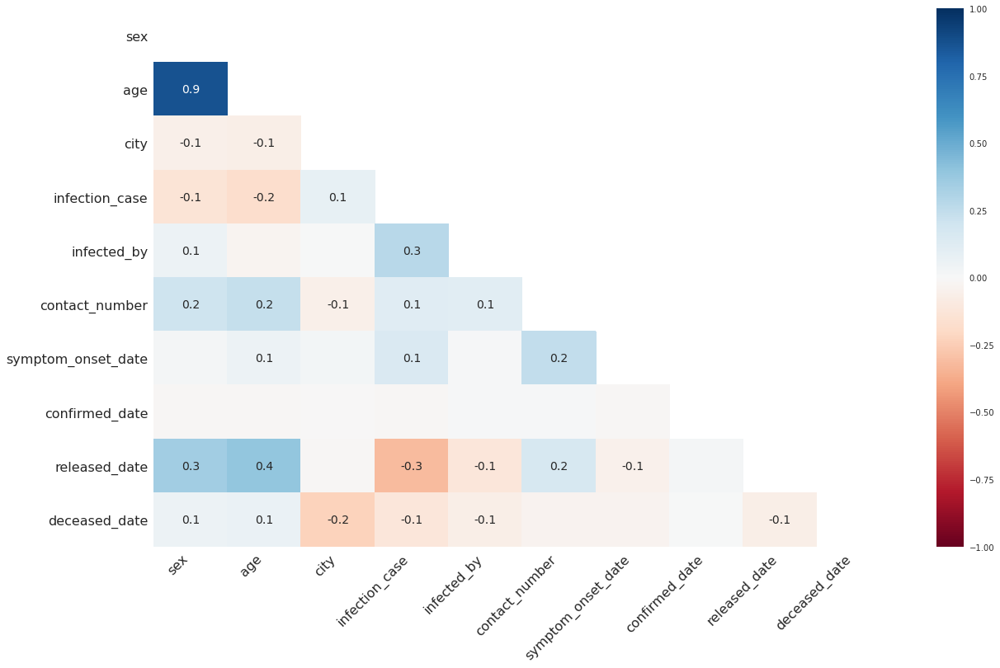

In [129]:
msno.heatmap(data_dict['patientinfo'])
plt.show()

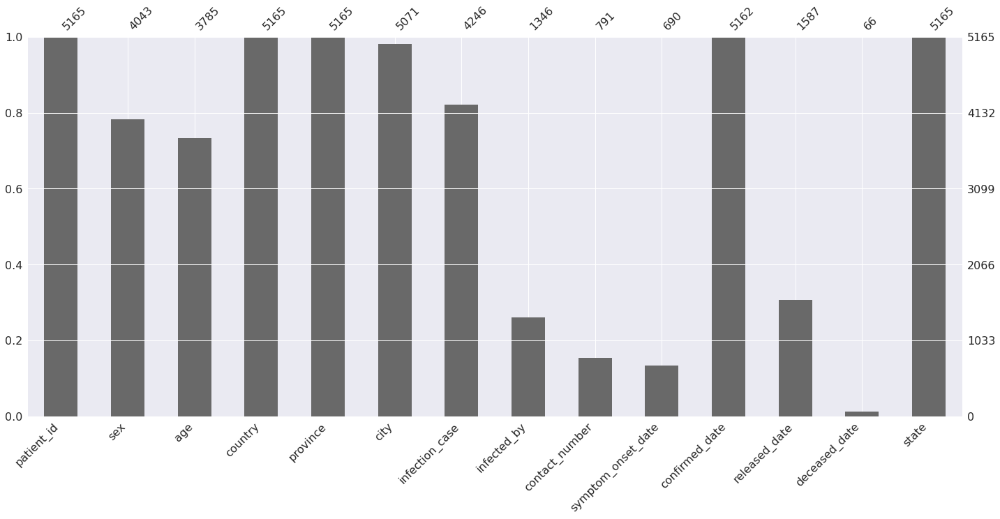

In [130]:
msno.bar(patientinfo)
plt.show()

In [131]:
def patientInfo_cleaning(data):
    df = data.copy()
    df['sex'] = df['sex'].fillna('_missing_')
    df['age'] = df['age'].str.replace("s", '').astype(float)
    df['age'] = df['age'].fillna(-999)
    df['city'] = df['city'].fillna('_missing_')
    df['contact_number'] = df['contact_number'].replace('-', np.nan)
    df['contact_number'] = df['contact_number'].astype(float)
    df['confirmed_date'] = pd.to_datetime(df['confirmed_date'])
    df = geocity_processing(df)    
    return(df)

patientinfo =  patientInfo_cleaning(data_dict['patientinfo'])

could not geocode the city: Dalsung-gun
could not geocode the city: Kyeongsan-si
could not geocode the city: sankyeock-dong
could not geocode the city: Hanam-si


In [132]:
patientinfo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5165 entries, 0 to 5164
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   patient_id          5165 non-null   Int64         
 1   sex                 5165 non-null   string        
 2   age                 5165 non-null   float64       
 3   country             5165 non-null   string        
 4   province            5165 non-null   string        
 5   city                5165 non-null   string        
 6   infection_case      4246 non-null   string        
 7   infected_by         1346 non-null   string        
 8   contact_number      787 non-null    float64       
 9   symptom_onset_date  690 non-null    string        
 10  confirmed_date      5162 non-null   datetime64[ns]
 11  released_date       1587 non-null   string        
 12  deceased_date       66 non-null     string        
 13  state               5165 non-null   string      

#### Distribution of sex

In [134]:
patientinfo['sex'].describe()

count       5165
unique         3
top       female
freq        2218
Name: sex, dtype: object

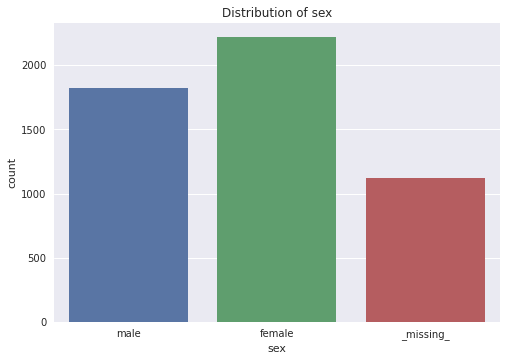

In [135]:
sns.countplot(patientinfo['sex'])
plt.title('Distribution of sex')
plt.show()

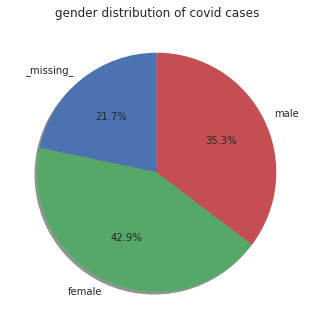

In [136]:
patient_sex = patientinfo.groupby('sex')['patient_id'].count()
labels = ['_missing_', 'female', 'male']
plt.pie(patient_sex, labels=labels, shadow=True, startangle=90, autopct='%1.1f%%')
plt.title('gender distribution of covid cases')
plt.show()

#### Observation 2:
If we ignore the missing values, there seems to be some relation of gender to covid cases.
Say it can be claimed that female are more likely to be infected with covid than male.

But if we consider the missing data, which is aprox 22%, which is more than the difference in gender, than it doesnt seem to make sense.

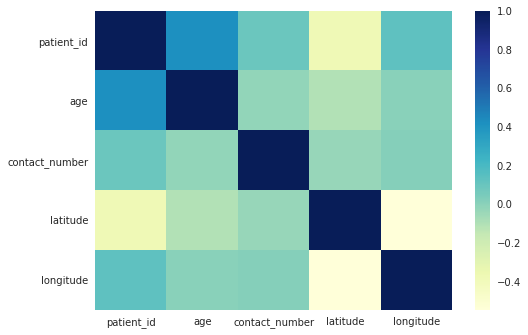

In [137]:
sns.heatmap(patientinfo.corr(), cmap='YlGnBu')
plt.show()

#### Distribution of age

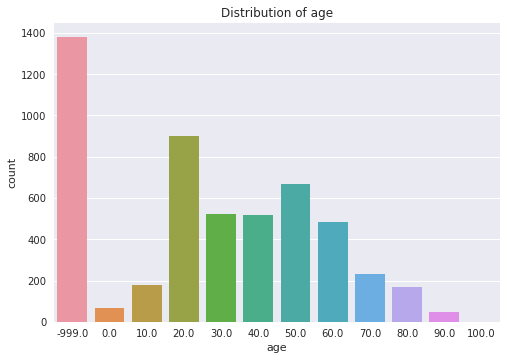

In [138]:
sns.countplot(patientinfo['age'])
plt.title('Distribution of age')
plt.show()

#### City wise distribution of covid-19 cases

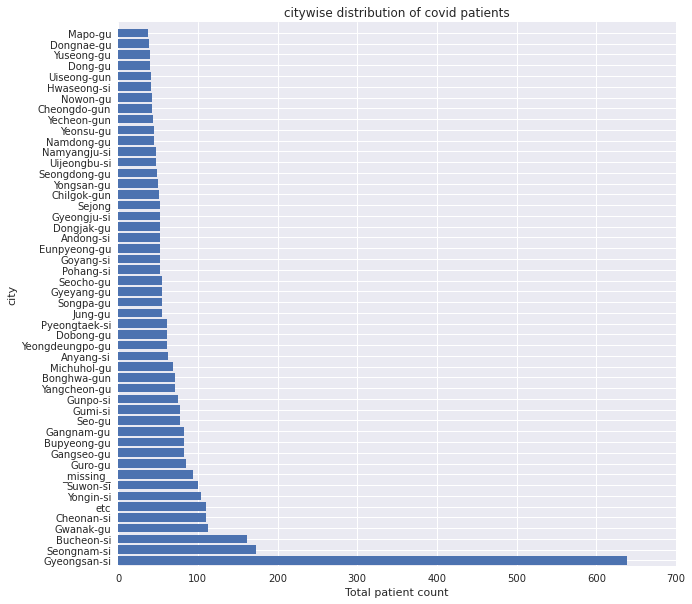

In [139]:
patientinfo_city = patientinfo.groupby('city')['patient_id'].count().reset_index() \
                    .sort_values('patient_id', ascending=False).head(50)
plt.figure(figsize=(10,10))
plt.barh('city', 'patient_id', data=patientinfo_city)
plt.xlabel('Total patient count')
plt.ylabel('city')
plt.title('citywise distribution of covid patients')
plt.ylim([-0.5,50])
plt.xlim([0,700])
plt.show()

#### Infection case wise distribution of covid-19 cases

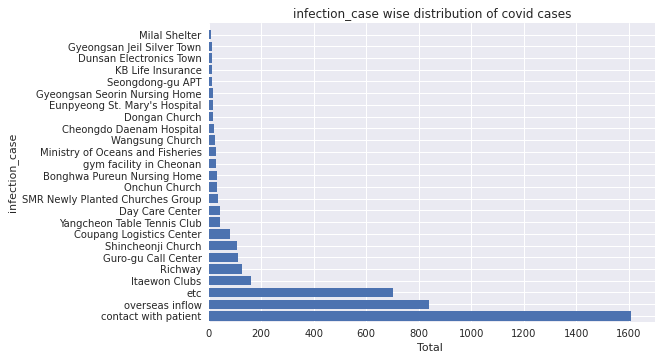

In [140]:
patientinfo_case = patientinfo.groupby('infection_case')['patient_id'].count().reset_index() \
                    .sort_values('patient_id', ascending=False).reset_index(drop=True).head(25)
patientinfo_case.columns = ['infection_case', 'infection_count']
plt.barh('infection_case', 'infection_count', data=patientinfo_case)
plt.xlabel('Total ')
plt.ylabel('infection_case')
plt.ylim([-0.5,25])
plt.xlim([0,1700])
plt.title('infection_case wise distribution of covid cases')
plt.show()

#### Overseas country wise distribution of covid-19 cases

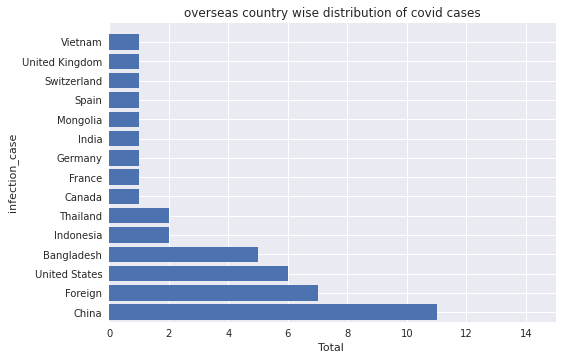

In [141]:
patientinfo_case_cntry= patientinfo[patientinfo['country'] != 'Korea'].groupby('country')['patient_id'].count().reset_index() \
                    .sort_values('patient_id', ascending=False).head(25)
plt.barh('country', 'patient_id', data=patientinfo_case_cntry)
plt.xlabel('Total ')
plt.ylabel('infection_case')
plt.ylim([-0.5,15])
plt.xlim([0,15])
plt.title('overseas country wise distribution of covid cases')
plt.show()

In [142]:
# patientinfo_contact = data['patientinfo'].groupby(by='infected_by').count()
# patientinfo_contact = patientinfo_contact.head().reset_index()

In [143]:
# plt.plot(patientinfo_contact['infected_by'],patientinfo_contact['patient_id'])
# plt.show()

In [144]:
patientinfo_case = patientinfo_case.sort_values('infection_count')
patientinfo_case_order= patientinfo_case['infection_case'].to_list()
title = 'Infection case distribution'
base = alt.Chart(patientinfo_case)

encoding = base.encode(
            y=alt.Y(
                'infection_case:N',
                sort=patientinfo_case_order),
            x = alt.X('infection_count:Q',                      
                      title = 'infection count'
                    ),
            color = alt.Color('infection_case:N',
                        sort=patientinfo_case_order[::-1])
)

def mark_bar():
    return(encoding.mark_bar().properties(title=title))

def mark_point():
    return(encoding.mark_point().properties(title=title))

def mark_circle():
    encodeing    =encoding.encode(
                    alt.Size('infection_count:Q', scale=alt.Scale(range=[50, 2500], zero=False)
                ,legend=alt.Legend(symbolFillColor='transparent')
                ,title='Count of infections'))              
    return(encodeing.mark_circle().properties(title=title))

bar = mark_bar()
point = mark_point()
circle = mark_circle()

#### Grammer-of-Graphics - Expressive but not effective

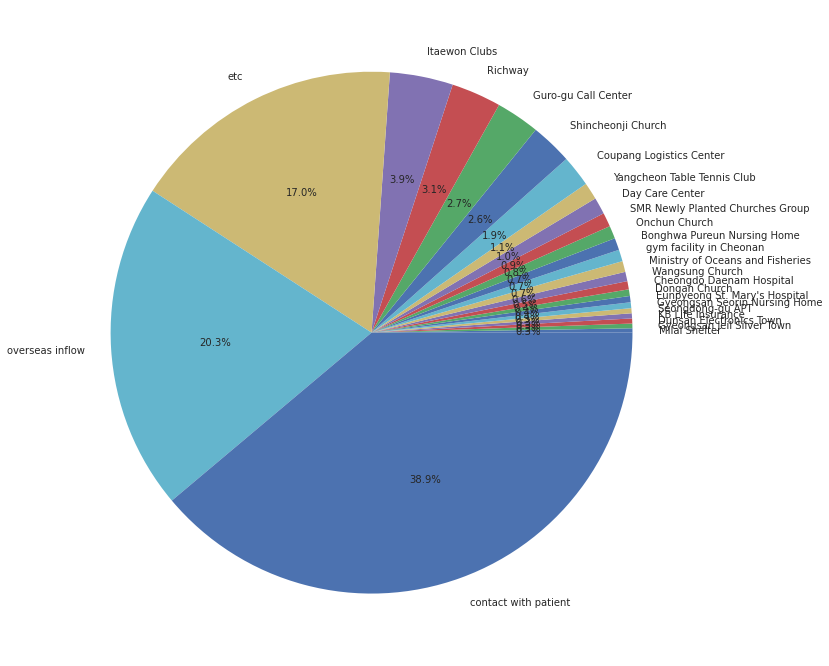

In [145]:
labels = patientinfo_case_order
fig, ax = plt.subplots(figsize=(12,12))
plt.pie(patientinfo_case['infection_count'], labels=labels, autopct='%1.1f%%')
plt.show()
# Expressive but not effective

In [146]:
bar

alt.Chart(...)

In [147]:
point

alt.Chart(...)

In [148]:
circle

alt.Chart(...)

In [149]:
def draw_bar(df, category, col_name, sort_order, title=''):
    bars = alt.Chart(df).mark_bar().encode(
                x= alt.X(f'{col_name}:Q',
                     title=f'{col_name}'),
                y = alt.Y(f'{category}:N',
                     sort=patientinfo_case_order),                
                color = alt.Color(f'{category}:N',
                        scale=alt.Scale(scheme='spectral',
                                reverse=True),
                        sort=sort_order)
                )    
    return(bars)

def draw_text(df, category, col_name, sort_order, title):
    text = alt.Chart(df).mark_text(align='left').encode(
                x= alt.X(f'{col_name}:Q',
                     title=f'{col_name}'),
                y = alt.Y(f'{category}:N',
                     sort=sort_order),                
                text = alt.Text(f'{col_name}:Q'
                ))    
    return(text)

#### Grammer-of-Graphics - Expressive as well as Effective

In [150]:
sort_order = patientinfo_case_order
bar = draw_bar(patientinfo_case, 'infection_case','infection_count',patientinfo_case_order, title='')
text = draw_text(patientinfo_case, 'infection_case','infection_count', patientinfo_case_order, title='')
(bar +text).properties(title=title)

alt.LayerChart(...)

#### ClusterMarker map for covid-19 case count

In [151]:
patientinfo_geo = patientinfo.dropna(subset=['geometry'])
city = 'Seoul'
visualize_data_mcgroup(city, patientinfo_geo)

#### ClusterMarker Heatmap for covid-19 case count

In [152]:
seoul_geocode = [36, 128]
m = geo_clusterheatmap(seoul_geocode, heat_case, patientinfo_geo)
m

### Explore patients route info

### Track covid hotspots by patient route

In [153]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'
    
def track_covid_route(patientinfo,route, patientid):
    '''visualize hospital data in MarkerCluster'''
    patient_df = patientinfo[patientinfo['patient_id'] == patientid].reset_index()
    route_df = route[route['patient_id'] == patientid].copy().reset_index()
    try:
        point = route_df['geometry'].values[0]
    except:
        print(color.BLUE + color.BOLD + 'No route informaiton available for this patient: {}'.format(patientid))
        return
    print(color.BOLD + color.RED + '{} patient made contacts with {} people'.format(patientid, patient_df.contact_number.values[0]))
    
    icon_plane1 = plugins.BeautifyIcon(icon='plane', icon_shape='triangle', border_color='green', text_color='green')
    icon_plane2 = plugins.BeautifyIcon(icon='plane', icon_shape='triangle', border_color='green', text_color='green')    
    
    m_1 = folium.Map(location=[point.y, point.x], tiles='openstreetmap', zoom_start=7, titles='My title')
    folium.Marker(location=[37.4692, 126.451], popup='incheon airport', icon=icon_plane1).add_to(m_1)
    folium.Marker(location=[37.558808, 126.794458], popup='gimpo airport', icon=icon_plane2).add_to(m_1)
    
    route = folium.Polygon(locations=route_df[['latitude','longitude']], 
                            fill=True)
    
    for lat, long, city in zip(route_df.latitude, route_df.longitude, route_df.city):
        folium.Circle(location=[lat, long], radius=400, color='red', tooltip=city).add_to(m_1)

    m_1.add_child(route)
    return(m_1)

top_contributor= patientinfo[['patient_id','contact_number']]           \
                    .sort_values('contact_number', ascending=False)['patient_id'][3:15].values

patientroute = data_dict['patientroute']
route_gdf = geocitylatlong_processing(patientroute)

patient = top_contributor[0]
track_covid_route(patientinfo,route_gdf, patient)

1200000031 patient made contacts with 1160.0 people


In [154]:
patient = top_contributor[1]
track_covid_route(patientinfo,route_gdf, patient)

No route informaiton available for this patient: 1100000001


In [155]:
patient = top_contributor[4]
track_covid_route(patientinfo,route_gdf, patient)

2000000003 patient made contacts with 422.0 people


In [156]:
patient = top_contributor[5]
track_covid_route(patientinfo,route_gdf, patient)

patient = top_contributor[6]
track_covid_route(patientinfo,route_gdf, patient)

No route informaiton available for this patient: 1100000012
2000000006 patient made contacts with 290.0 people


In [157]:
patient = top_contributor[7]
track_covid_route(patientinfo,route_gdf, patient)

patient = top_contributor[8]
track_covid_route(patientinfo,route_gdf, patient)

patient = top_contributor[9]
track_covid_route(patientinfo,route_gdf, patient)

patient = top_contributor[10]
track_covid_route(patientinfo,route_gdf, patient)

No route informaiton available for this patient: 1100000128
No route informaiton available for this patient: 4100000090
No route informaiton available for this patient: 1100000039
No route informaiton available for this patient: 1300000005


### Track covi-19 hotspots by province

In [158]:
def track_covid_route_hotspots(patientinfo,route, adm_division, adm_div_name):
    '''visualize hospital data in MarkerCluster'''
    patient_df = patientinfo[patientinfo[adm_division] == adm_div_name].reset_index()
    route_df = route[route[adm_division] == adm_div_name].copy().reset_index()
    try:
        point = route_df['geometry'].values[0]
        hotspots_no = route_gdf[route_gdf[adm_division] == adm_div_name].count()[0]
    except:
        print(color.RED + color.BOLD + 'No route informaiton available for the patients in city: {}'.format(adm_div_name))
        return
    print(color.BOLD + color.RED + 'There are {} covid hotspots in {}'.format(hotspots_no, adm_div_name))
    
    m_1 = folium.Map(location=[point.y, point.x], tiles='openstreetmap', zoom_start=11, titles='My title')    
    route = folium.Polygon(locations=route_df[['latitude','longitude']], 
                            fill=True, tooltip=adm_div_name, popup=adm_div_name)
    
    for lat, long,city in zip(route_df.latitude, route_df.longitude, route_df.city):
        folium.Circle(location=[lat, long], radius=400, color='red', tooltip=city).add_to(m_1)

    m_1.add_child(route)
    return(m_1)

top_hotspots_province = route_gdf.groupby('province')['patient_id'].count()      \
                .sort_values(ascending=False).reset_index()['province'][:5]
province = top_hotspots_province[0]
track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

There are 76 covid hotspots in Seoul


In [159]:
province = top_hotspots_province[1]
track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

There are 55 covid hotspots in Gyeonggi-do


In [160]:
province = top_hotspots_province[2]
track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

There are 17 covid hotspots in Incheon


In [161]:
province = top_hotspots_province[3]
track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

There are 11 covid hotspots in Daegu


### Track covi-19 hotspots by city

In [162]:
top_hotspots_city = route_gdf.groupby('city')['patient_id'].count()      \
                .sort_values(ascending=False).reset_index()['city'][:5]

city = top_hotspots_city[0]
track_covid_route_hotspots(patientinfo,route_gdf, 'city',city)

There are 32 covid hotspots in Jongno-gu


In [163]:
city = top_hotspots_city[1]
track_covid_route_hotspots(patientinfo,route_gdf, 'city',city)

There are 23 covid hotspots in Jung-gu


In [164]:
city = top_hotspots_city[2]
track_covid_route_hotspots(patientinfo,route_gdf, 'city',city)

There are 9 covid hotspots in Jungnang-gu


### Exploring the region dataset

In [165]:
region_gdf = geocitylatlong_processing(data_dict['region'])
region = data_dict['region']
visualize_data_mcgroup('Seoul', region)

### Explor policy dataset

In [166]:
data_dict['policy'].head()

,policy_id,country,type,gov_policy,detail,start_date,end_date,Unnamed: 7,Unnamed: 8
0,1,Korea,Alert,Infectious Disease Alert Level,Level 1 (Blue),1/3/2020,1/19/2020,Prevent,<NA>
1,2,Korea,Alert,Infectious Disease Alert Level,Level 2 (Yellow),1/20/2020,1/27/2020,Prevent,<NA>
2,3,Korea,Alert,Infectious Disease Alert Level,Level 3 (Orange),1/28/2020,2/22/2020,Prevent,<NA>
3,4,Korea,Alert,Infectious Disease Alert Level,Level 4 (Red),2/23/2020,<NA>,Prevent,<NA>
4,5,Korea,Immigration,Special Immigration Procedure,from China,2/4/2020,<NA>,Prevent,<NA>


### Explore SeoulFloating dataset
- Work in Progress

In [167]:
seoulfloating = data_dict['seoulfloating'].copy()
seoulfloating['date'] = pd.to_datetime(seoulfloating['date'])
seoulfloating = seoulfloating.set_index('date')
seoulfloating.head()

,hour,birth_year,sex,province,city,fp_num
date,,,,,,
2020-01-01,0,20,female,Seoul,Dobong-gu,19140
2020-01-01,0,20,male,Seoul,Dobong-gu,19950
2020-01-01,0,20,female,Seoul,Dongdaemun-gu,25450
2020-01-01,0,20,male,Seoul,Dongdaemun-gu,27050
2020-01-01,0,20,female,Seoul,Dongjag-gu,28880


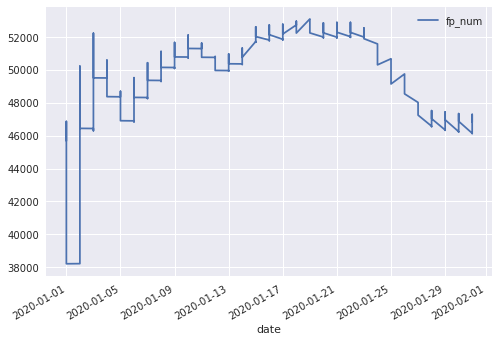

In [216]:
data = seoulfloating[(seoulfloating['city'] == 'Gangnam-gu')]['2020-01']
fig, ax = plt.subplots()
data[['fp_num']].rolling('14D').mean().plot(ax=ax)
plt.show()

### Exploring the time dataset

In [170]:
time = data_dict['time'].copy()
time.index = pd.DatetimeIndex(time['date'])
time = time.drop(['date'], axis=1)
time = time.diff().bfill()
time.head()

,time,test,negative,confirmed,released,deceased
date,,,,,,
2020-01-20,0,0,0,0,0,0
2020-01-21,0,0,0,0,0,0
2020-01-22,0,3,3,0,0,0
2020-01-23,0,18,18,0,0,0
2020-01-24,0,5,4,1,0,0


In [171]:
def set_dateIndex(data):
    df = data.copy()
    df['date'] = pd.to_datetime(df['date'])
    df = df.set_index('date')
    return(df)

time = set_dateIndex(data_dict['time'])
time.head()

,time,test,negative,confirmed,released,deceased
date,,,,,,
2020-01-20,16,1,0,1,0,0
2020-01-21,16,1,0,1,0,0
2020-01-22,16,4,3,1,0,0
2020-01-23,16,22,21,1,0,0
2020-01-24,16,27,25,2,0,0


In [172]:
time = data_dict['time'].copy()
time = set_dateIndex(data_dict['time'])
time = time.diff().bfill()

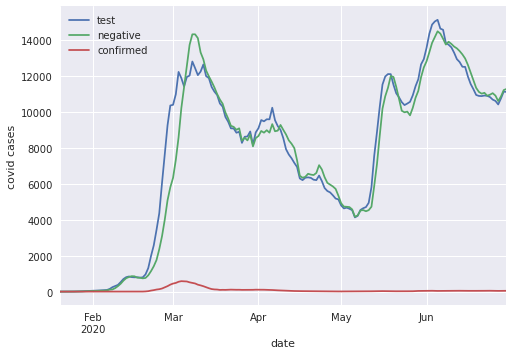

In [173]:
cols_to_plot = ['test','negative', 'confirmed']
time[cols_to_plot].rolling('7D').mean().plot()
plt.ylabel('covid cases')
plt.show()

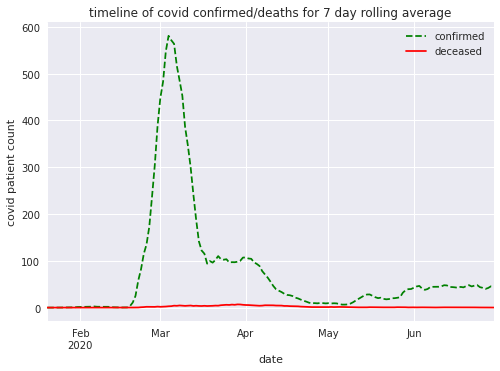

In [174]:
cols_to_plot = ['confirmed', 'deceased']
time[cols_to_plot].rolling('7D').mean().plot(color=['g', 'r'], style=['--', '-'])
plt.ylabel('covid patient count')
plt.title('timeline of covid confirmed/deaths for 7 day rolling average')
plt.show()

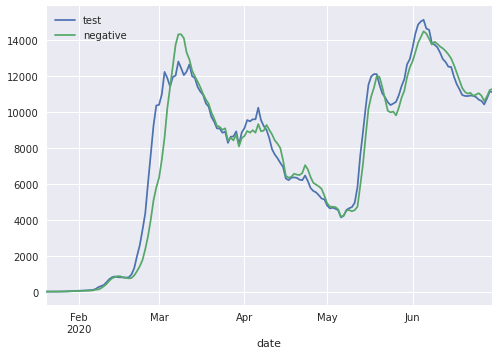

In [175]:
cols_to_plot = ['test', 'negative']
time[cols_to_plot].rolling('7D').mean().plot()
plt.show()

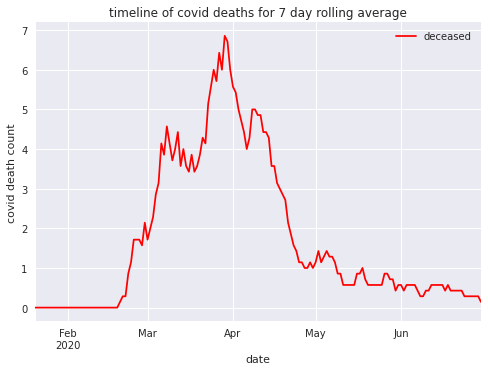

In [176]:
cols_to_plot = ['deceased']
time[cols_to_plot].rolling('7D').mean().plot(c='r')
plt.ylabel('covid death count')
plt.title('timeline of covid deaths for 7 day rolling average')
plt.show()

### Explore Policy dataset

In [177]:
policy = data_dict['policy'].copy()
policy.head(5)

,policy_id,country,type,gov_policy,detail,start_date,end_date,Unnamed: 7,Unnamed: 8
0,1,Korea,Alert,Infectious Disease Alert Level,Level 1 (Blue),1/3/2020,1/19/2020,Prevent,<NA>
1,2,Korea,Alert,Infectious Disease Alert Level,Level 2 (Yellow),1/20/2020,1/27/2020,Prevent,<NA>
2,3,Korea,Alert,Infectious Disease Alert Level,Level 3 (Orange),1/28/2020,2/22/2020,Prevent,<NA>
3,4,Korea,Alert,Infectious Disease Alert Level,Level 4 (Red),2/23/2020,<NA>,Prevent,<NA>
4,5,Korea,Immigration,Special Immigration Procedure,from China,2/4/2020,<NA>,Prevent,<NA>


In [178]:
policy['start_date'] = pd.to_datetime(policy['start_date'])
policy['end_date'] = pd.to_datetime(policy['end_date'])

policy = policy.drop_duplicates(subset='gov_policy', keep='first')
policy = policy.set_index('start_date') 
policy.head(5)

,policy_id,country,type,gov_policy,detail,end_date,Unnamed: 7,Unnamed: 8
start_date,,,,,,,,
2020-01-03,1,Korea,Alert,Infectious Disease Alert Level,Level 1 (Blue),2020-01-19,Prevent,<NA>
2020-02-04,5,Korea,Immigration,Special Immigration Procedure,from China,NaT,Prevent,<NA>
2020-04-01,18,Korea,Immigration,Mandatory 14-day Self-Quarantine,from all the countries,NaT,Contain,<NA>
2020-04-13,19,Korea,Immigration,Mandatory Self-Quarantine & Diagonostic Tests,from U.S.,NaT,Detect,<NA>
2020-02-04,20,Korea,Health,Emergency Use Authorization of Diagnostic Kit,1st EUA,NaT,Detect,<NA>


In [179]:
time = data_dict['time']
time = set_dateIndex(time)
time = time.diff().bfill()
policy_time = pd.merge(policy, time, left_index=True, right_index=True)

In [231]:
# Work in progrss
# import matplotlib.dates as mdates
# style = dict(size=15, color='black')
# fig, ax = plt.subplots(figsize=(12,8))
# policy_time[['confirmed']].rolling('14D').mean().plot(style=['-'], ax=ax)
# for idx, row in policy_time[2:6:2].iterrows():    
#     ax.text(idx, row['confirmed'], row['gov_policy'], **style)
# plt.show()

### Exploring timeage datasets

In [181]:
timeage = data_dict['timeage'].copy()
timeage['date'] = pd.to_datetime(timeage['date'])
timeage = timeage.set_index('date')
timeage.head()

,time,age,confirmed,deceased
date,,,,
2020-03-02,0,0s,32,0
2020-03-02,0,10s,169,0
2020-03-02,0,20s,1235,0
2020-03-02,0,30s,506,1
2020-03-02,0,40s,633,1


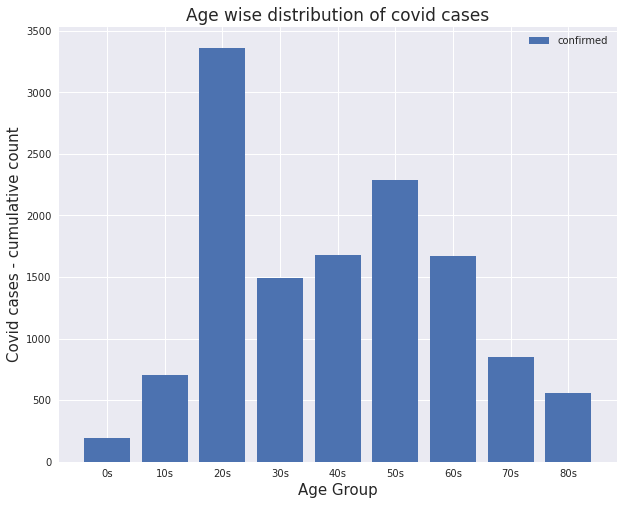

In [182]:
fig, ax = plt.subplots(figsize=(10,8))
plt.bar(timeage['age'], timeage['confirmed'], label='confirmed')
plt.xlabel('Age Group', size=15)
plt.ylabel('Covid cases - cumulative count', size=15)
plt.legend()
plt.title('Age wise distribution of covid cases', size=17)
plt.show()

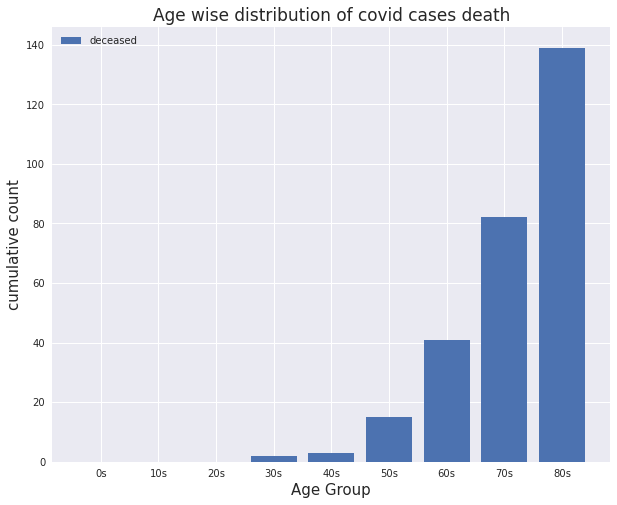

In [183]:
fig, ax = plt.subplots(figsize=(10,8))
y_pos = np.arange(2)
plt.bar(timeage['age'], timeage['deceased'], label='deceased')
plt.xlabel('Age Group', size=15)
plt.ylabel('cumulative count', size=15)
plt.title('Age wise distribution of covid cases death', size=17)
plt.legend()
plt.show()

In [184]:
timeage['age'] = timeage['age'].str.replace("s", '').astype(int)
timeage.head()

,time,age,confirmed,deceased
date,,,,
2020-03-02,0,0,32,0
2020-03-02,0,10,169,0
2020-03-02,0,20,1235,0
2020-03-02,0,30,506,1
2020-03-02,0,40,633,1


#### Age wise growth of covid-19 cases over time

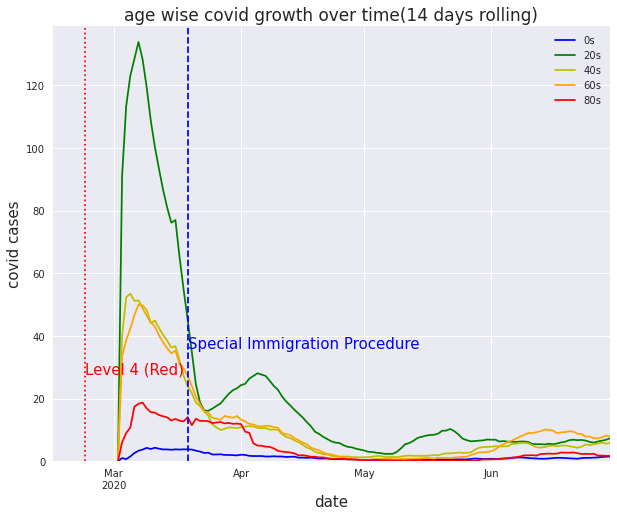

In [185]:
def data_grp(data, grp):
    df = data.copy()
    df_grp = df[df['age'] == grp]
    df_grp = df_grp.diff().fillna(0)
    return(df_grp)

timeage_0 = data_grp(timeage, 0)
timeage_20 = data_grp(timeage, 20)
timeage_40 = data_grp(timeage, 40)
timeage_60 = data_grp(timeage, 60)
timeage_80 = data_grp(timeage, 80)
timeage_80.head()

fig, ax = plt.subplots(figsize=(10,8))
timeage_0['confirmed'].rolling('14D').mean().plot(ax = ax, color='b', label='0s')
timeage_20['confirmed'].rolling('14D').mean().plot(ax = ax, color='g', label='20s')
timeage_40['confirmed'].rolling('14D').mean().plot(ax = ax, color='y', label='40s')
timeage_60['confirmed'].rolling('14D').mean().plot(ax = ax, color='orange', label='60s')
timeage_80['confirmed'].rolling('14D').mean().plot(ax = ax, color='r', label='80s')
plt.axvline(x='2020-02-23', color='r', ls=':')
plt.axvline(x='2020-03-19', color='b', ls='--')

roll_14D_mean_max = timeage_20['confirmed'].rolling('14D').mean().max()
ax.text('2020-02-23', roll_14D_mean_max//5+2,'Level 4 (Red)', color='r', size=15)
ax.text('2020-03-19', roll_14D_mean_max//4+3, 'Special Immigration Procedure', color='blue', size=15)    


plt.ylim([0,roll_14D_mean_max+5])
plt.xlim(['15-02-20', '30-06-20'])
plt.legend()

plt.title('age wise covid growth over time(14 days rolling)', size=17)
plt.ylabel('covid cases', size=15)
plt.xlabel('date', size=15)
plt.show()

#### Age wise growth of covid-19 deaths over time

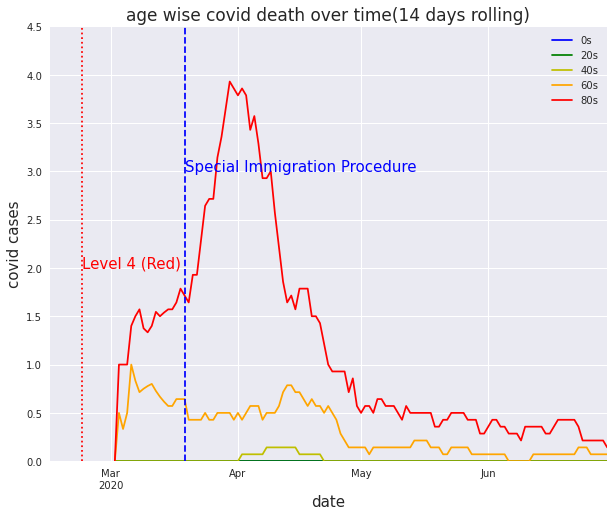

In [186]:
fig, ax = plt.subplots(figsize=(10,8))
timeage_0['deceased'].rolling('14D').mean().plot(ax = ax, color='b', label='0s')
timeage_20['deceased'].rolling('14D').mean().plot(ax = ax, color='g', label='20s')
timeage_40['deceased'].rolling('14D').mean().plot(ax = ax, color='y', label='40s')
timeage_60['deceased'].rolling('14D').mean().plot(ax = ax, color='orange', label='60s')
timeage_80['deceased'].rolling('14D').mean().plot(ax = ax, color='r', label='80s')
plt.axvline(x='2020-02-23', color='r', ls=':')
plt.axvline(x='2020-03-19', color='b', ls='--')

roll_14D_mean_max = timeage_80['deceased'].rolling('14D').mean().max()
ax.text('2020-02-23', roll_14D_mean_max//5+2,'Level 4 (Red)', color='r', size=15)
ax.text('2020-03-19', roll_14D_mean_max//4+3, 'Special Immigration Procedure', color='blue', size=15)    


plt.ylim([0,4.5])
plt.xlim(['15-02-20', '30-06-20'])
plt.legend()

plt.title('age wise covid death over time(14 days rolling)', size=17)
plt.ylabel('covid cases', size=15)
plt.xlabel('date', size=15)
plt.show()

In [187]:
cols_to_use = ['age', 'confirmed', 'deceased']
timeage[cols_to_use].corr(method='pearson')

,age,confirmed,deceased
age,1.000000,-0.039002,0.762953
confirmed,-0.039002,1.000000,-0.277291
deceased,0.762953,-0.277291,1.000000


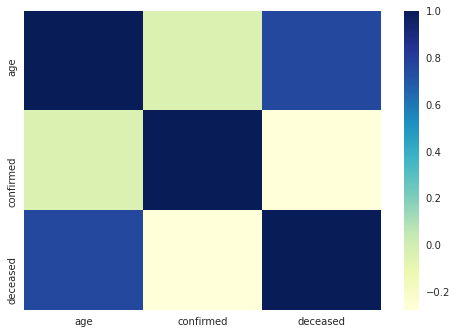

In [188]:
sns.heatmap(timeage[cols_to_use].corr(), cmap='YlGnBu')
plt.show()

In [189]:
stats.pearsonr(timeage['age'], timeage['confirmed'])

(-0.03900227549960312, 0.19841294557944533)

In [190]:
stats.ttest_ind(timeage['age'], timeage['confirmed'], axis=0)

Ttest_indResult(statistic=-44.83250649363106, pvalue=1.7893706141666e-311)

<b>p-value is less than 5%(near zero), hence we reject the null hypothesis that confirmed cases are same across different age groups.
<br>That is covid-transmission are different across different age groups.

<b>Through t-test we can say that covid deaths has correlation with age.<b>

In [191]:
stats.pearsonr(timeage['age'], timeage['deceased'])

(0.7629532434194041, 3.590060419570186e-208)

#### Hypothesis Test for age/covid deaths
Null Hypothesis:- Covid deaths are same across different age groups. 
<br>Alternate Hypothesis:- Covid deaths are not same across different age groups

Set Alpha: Consider alpha to be 5%

In [192]:
stats.ttest_ind(timeage['age'], timeage['deceased'], axis=0)

Ttest_indResult(statistic=12.040190261524781, pvalue=2.2778442262660211e-32)

<b>p-value is less than 5%(near zero), hence we reject the null hypothesis that covid deaths are same across different age groups.
<br>That is covid-deaths are different across different age groups.

#### Observation: 
There is strong positive correlation(0.76) between perople's age and covid deaths. 

In [193]:
data_dict['weather'].head()

,code,province,date,avg_temp,min_temp,max_temp,precipitation,max_wind_speed,most_wind_direction,avg_relative_humidity
0,10000,Seoul,2016-01-01,1.2,-3.3,4.0,0.0,3.5,90,73.0
1,11000,Busan,2016-01-01,5.3,1.1,10.9,0.0,7.4,340,52.1
2,12000,Daegu,2016-01-01,1.7,-4.0,8.0,0.0,3.7,270,70.5
3,13000,Gwangju,2016-01-01,3.2,-1.5,8.1,0.0,2.7,230,73.1
4,14000,Incheon,2016-01-01,3.1,-0.4,5.7,0.0,5.3,180,83.9


### Explore SearchTrend dataset 

In [194]:
searchtrend = data_dict['searchtrend'].copy()
searchtrend = set_dateIndex(searchtrend)
searchtrend_20 = searchtrend['2020']
searchtrend_20.head()

,cold,flu,pneumonia,coronavirus
date,,,,
2020-01-01,0.14454,0.48434,0.4488,0.01699
2020-01-02,0.19508,0.85751,0.36471,0.01827
2020-01-03,0.19581,0.80443,0.46598,0.02845
2020-01-04,0.60343,0.86961,0.49571,0.02136
2020-01-05,0.20081,0.84152,0.41644,0.01927


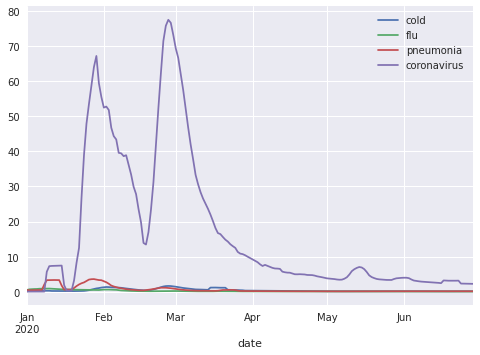

In [195]:
searchtrend_20.rolling('7D').mean().plot()
plt.show()

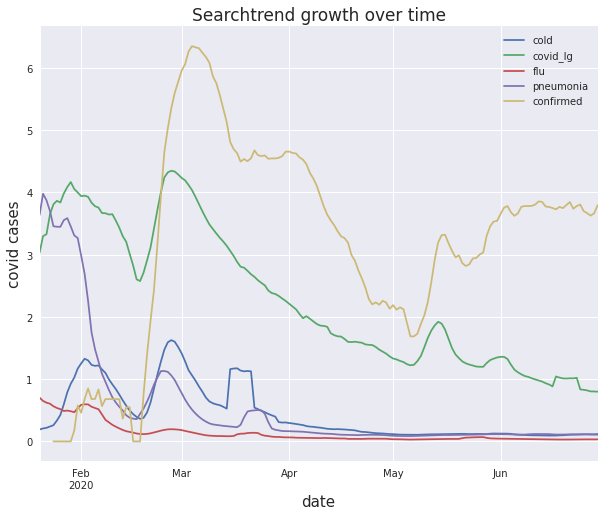

In [196]:
cols_to_use = ['cold', 'covid_lg','flu', 'pneumonia', 'confirmed']
time_lg = time[['confirmed']]
time_lg = np.log(time_lg).fillna(0)
search_time = searchtrend_20.join(time_lg['confirmed']).dropna()
search_time['covid_lg'] = np.log(search_time['coronavirus'])

fig, ax = plt.subplots(figsize=(10,8))
search_time[cols_to_use].rolling('7D').mean().plot(ax=ax)
plt.title('Searchtrend growth over time', size=17)
plt.ylabel('covid cases', size=15)
plt.xlabel('date', size=15)
plt.show()

In [197]:
search_time[cols_to_use].corr()

,cold,covid_lg,flu,pneumonia,confirmed
cold,1.000000,0.674172,0.441977,0.364537,0.124704
covid_lg,0.674172,1.000000,0.677310,0.617769,0.171543
flu,0.441977,0.677310,1.000000,0.867869,-0.322112
pneumonia,0.364537,0.617769,0.867869,1.000000,-0.299363
confirmed,0.124704,0.171543,-0.322112,-0.299363,1.000000


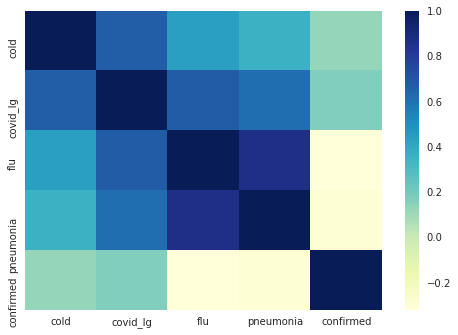

In [198]:
sns.heatmap(search_time[cols_to_use].corr(), cmap='YlGnBu')
plt.show()

#### Observation :
There is positive weak correlation between serach trends of cold, covid to confirmed cases of covid in South Korea.
<br>Also there is negative moderate correlation between search trend of flu and pneumonia to covid confirmed cases in South Korea.

### Explore timegender dataset 

In [202]:
timegender = data_dict['timegender'].copy()
timegender = set_dateIndex(data_dict['timegender'])
timegender = timegender.drop(columns='time')
timegender['sex'] = timegender['sex'].apply(lambda x: 1 if x == 'male' else 0)
timegender.head(5)

,sex,confirmed,deceased
date,,,
2020-03-02,1,1591,13
2020-03-02,0,2621,9
2020-03-03,1,1810,16
2020-03-03,0,3002,12
2020-03-04,1,1996,20


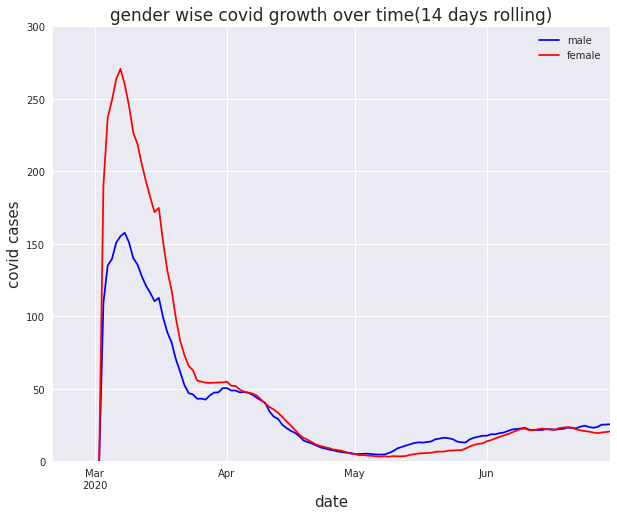

In [203]:
timegender_male = timegender[timegender['sex'] == 1]
timegender_male = timegender_male.diff().fillna(0)

timegender_female = timegender[timegender['sex'] == 0]
timegender_female = timegender_female.diff().fillna(0)

fig, ax = plt.subplots(figsize=(10,8))
timegender_male['confirmed'].rolling('14D').mean().plot(ax = ax, color='b', label='male')
timegender_female['confirmed'].rolling('14D').mean().plot(ax=ax, color='r', label='female')

plt.ylim([0,300])
plt.xlim(['20-02-20', '30-06-20'])
plt.legend()

plt.title('gender wise covid growth over time(14 days rolling)', size=17)
plt.ylabel('covid cases', size=15)
plt.xlabel('date', size=15)
plt.show()

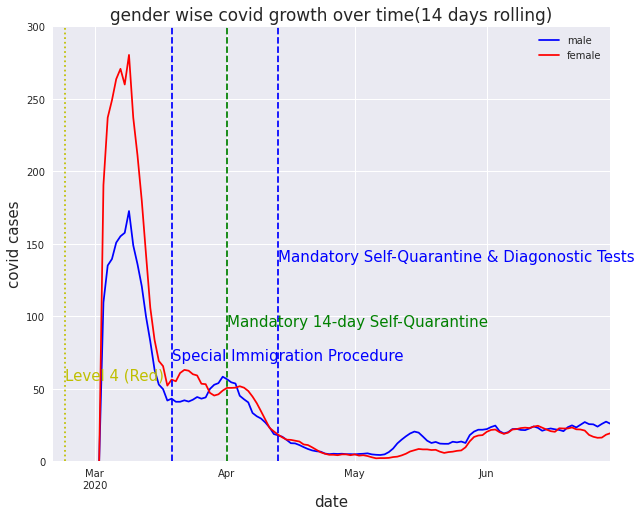

In [204]:
fig, ax = plt.subplots(figsize=(10,8))
timegender_male['confirmed'].rolling('7D').mean().plot(ax = ax, color='b', label='male')
timegender_female['confirmed'].rolling('7D').mean().plot(ax=ax, color='r', label='female')
plt.axvline(x='2020-02-23', color='y', ls=':')
plt.axvline(x='2020-03-19', color='b', ls='--')
plt.axvline(x='2020-04-01', color='g', ls='--')
plt.axvline(x='2020-04-13', color='b', ls='--')

roll_14D_mean_max = timegender_female['confirmed'].rolling('14D').mean().max()
ax.text('2020-02-23', roll_14D_mean_max//5+2,'Level 4 (Red)', color='y', size=15)
ax.text('2020-03-19', roll_14D_mean_max//4+3, 'Special Immigration Procedure', color='blue', size=15)    
ax.text('2020-04-01', roll_14D_mean_max//3+3, 'Mandatory 14-day Self-Quarantine', color='green', size=15) 
ax.text('2020-04-13', roll_14D_mean_max//2+3, 'Mandatory Self-Quarantine & Diagonostic Tests', color='blue', size=15)     

plt.ylim([0,300])
plt.xlim(['20-02-20', '30-06-20'])
plt.legend()

plt.title('gender wise covid growth over time(14 days rolling)', size=17)
plt.ylabel('covid cases', size=15)
plt.xlabel('date', size=15)
plt.show()

In [205]:
cols_to_use = ['sex', 'confirmed', 'deceased']
timegender[cols_to_use].corr()

,sex,confirmed,deceased
sex,1.000000,-0.748419,0.151513
confirmed,-0.748419,1.000000,0.507127
deceased,0.151513,0.507127,1.000000


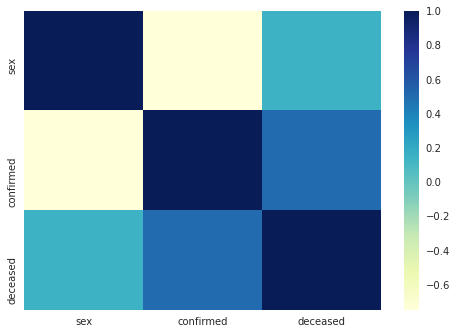

In [206]:
sns.heatmap(timegender[cols_to_use].corr(), cmap='YlGnBu')
plt.show()

#### Observation :
There is strong negative correlation between gender and confirmed cases of covid in South Korea. 
- That is female is more likely to contract the covid-19.

Also there is weak positive correlation between covid-death and covid confirmed cases in South Korea.
- That is male are more likely to die of covid than female.

### Explore timeprovince dataset

In [207]:
timeprovince = data_dict['timeprovince'].copy()
timeprovince = set_dateIndex(data_dict['timeprovince'])
timeprovince.head(5)

,time,province,confirmed,released,deceased
date,,,,,
2020-01-20,16,Seoul,0,0,0
2020-01-20,16,Busan,0,0,0
2020-01-20,16,Daegu,0,0,0
2020-01-20,16,Incheon,1,0,0
2020-01-20,16,Gwangju,0,0,0


In [208]:
# timeprovince['month'] = pd.DatetimeIndex(timeprovince.index).month
# timeprovince['month'] = timeprovince.index.month
# timeprovince_grp = timeprovince.groupby(by=['month', 'province'])
# timeprovince_grp.head()

In [209]:
timeprovince = data_dict['timeprovince'].copy()
timeprovince = timeprovince.drop(columns='time')
timeprovince['date'] = pd.to_datetime(timeprovince['date'])
timeprovince = timeprovince.set_index('date')

def transmission_causal_graph(data, province):
    df_prov = data.copy()
    df_prov = df_prov[df_prov['province'] == province]
    df_prov = df_prov[['confirmed', 'released']].diff()
    df_prov = df_prov.fillna(0)
    
    first_trans_date = df_prov[df_prov['confirmed'] > 0].index[0]
    fig, ax = plt.subplots(figsize=(12,8))
    df_prov = df_prov.rolling('14D').mean()
    df_prov.plot(ax=ax)
    plt.ylabel('covid count')    
    plt.title('covid fourteen day rolling mean for province: {}'.format(province))
    plt.axvline(x=first_trans_date, color='r', ls=':')
    plt.axvline(x='2020-02-23', color='y', ls=':')
    plt.axvline(x='2020-03-19', color='b', ls='--')
    plt.axvline(x='2020-04-01', color='g', ls='--')
    plt.axvline(x='2020-04-13', color='b', ls='--')
        
    roll_14D_mean_max = df_prov['confirmed'].rolling('14D').mean().max()
    ax.text(first_trans_date, roll_14D_mean_max//7,'First covid case in the province', color='red', size=15)
    ax.text('2020-02-23', roll_14D_mean_max//5+2,'Level 4 (Red)', color='y', size=15)
    ax.text('2020-03-19', roll_14D_mean_max//4+2, 'Special Immigration Procedure', color='blue', size=15)    
    ax.text('2020-04-01', roll_14D_mean_max//3+3, 'Mandatory 14-day Self-Quarantine', color='green', size=15) 
    ax.text('2020-04-13', roll_14D_mean_max//2+4, 'Mandatory Self-Quarantine & Diagonostic Tests', color='blue', size=15)     

    plt.show()
    
top_province = timeprovince.groupby('province').max().reset_index().sort_values('confirmed', ascending=False)['province'][:10].values

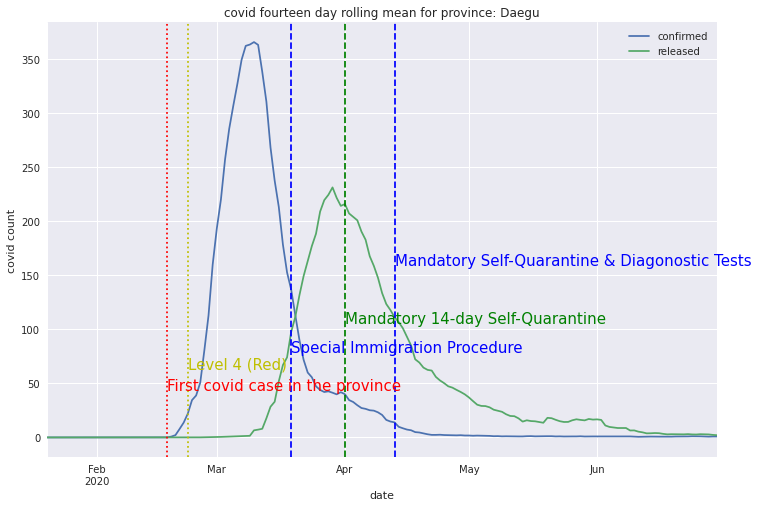

There are 11 covid hotspots in Daegu


In [210]:
province = top_province[0]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

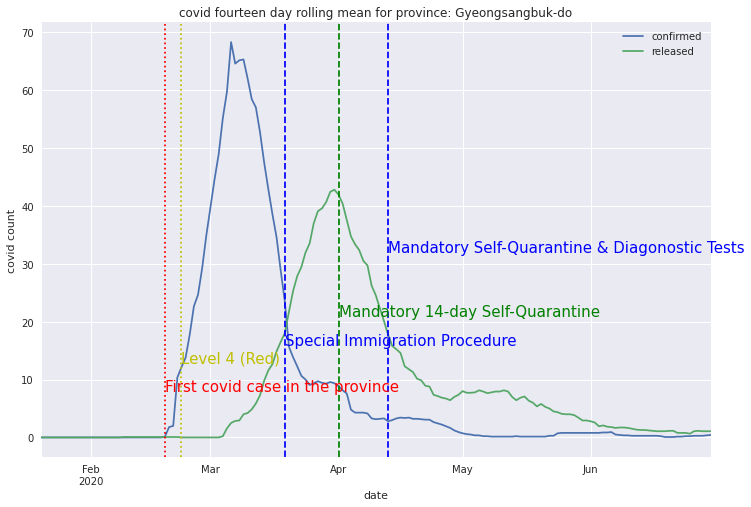

No route informaiton available for the patients in city: Gyeongsangbuk-do


In [211]:
province = top_province[1]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

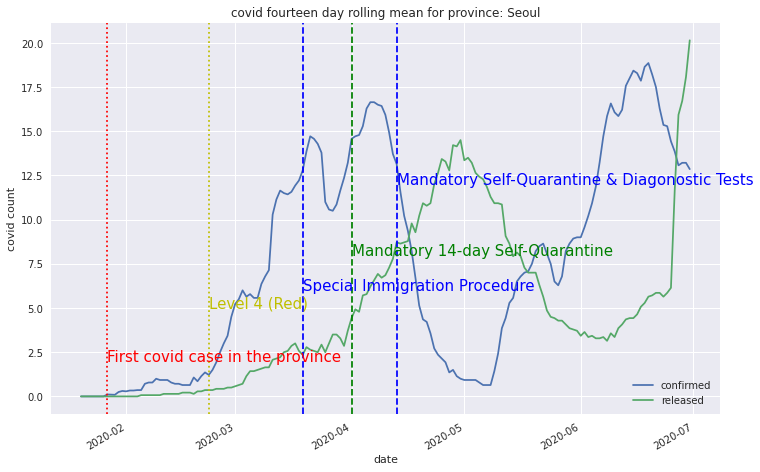

There are 76 covid hotspots in Seoul


In [212]:
province = top_province[2]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

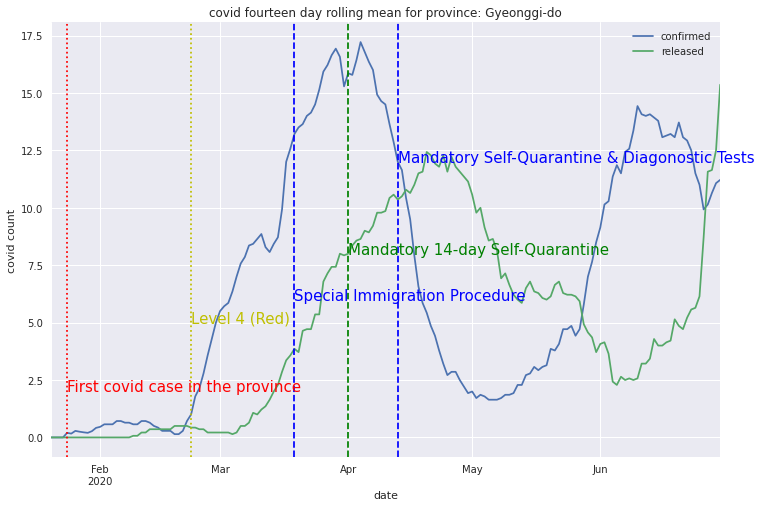

There are 55 covid hotspots in Gyeonggi-do


In [213]:
province = top_province[3]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

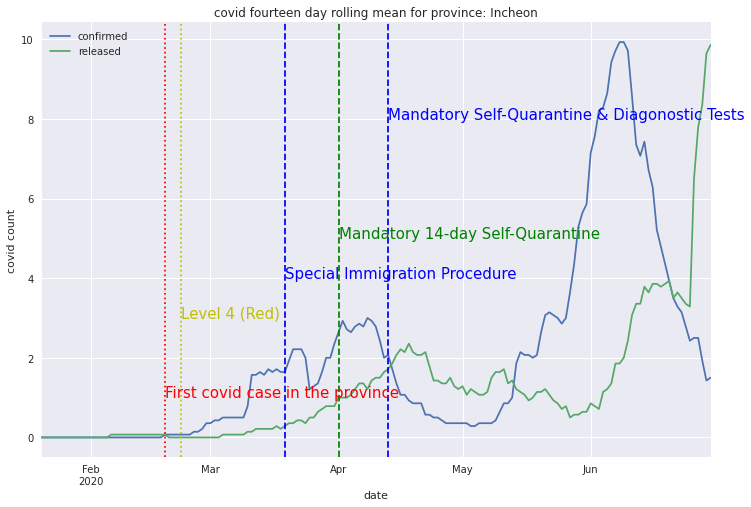

There are 17 covid hotspots in Incheon


In [214]:
province = top_province[4]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)

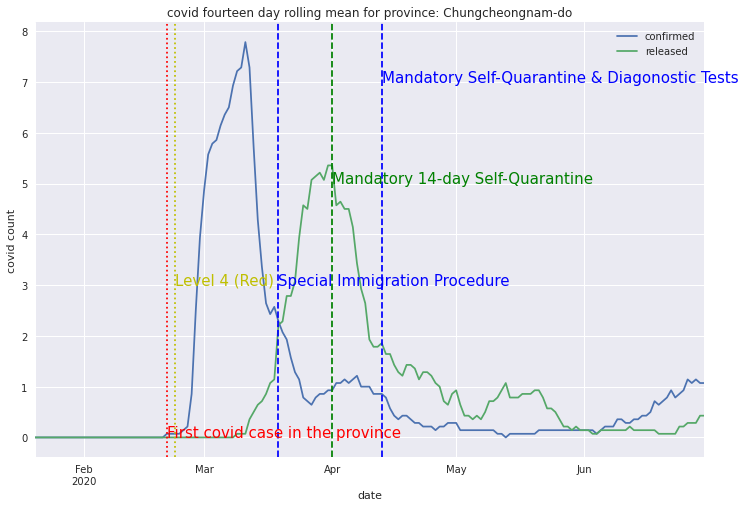

No route informaiton available for the patients in city: Chungcheongnam-do


In [215]:
province = top_province[5]
transmission_causal_graph(timeprovince, province)

track_covid_route_hotspots(patientinfo,route_gdf, 'province',province)